# Prediction of fuel consumption 

### Importing Libraries

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import to_hex
import seaborn as sns
from pathlib import Path

import folium #for drawing maps 
import ast
from shapely.geometry import Point, Polygon
from geopy.distance import geodesic


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error
from lightgbm import LGBMRegressor
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GroupShuffleSplit

import statsmodels.api as sm
from statsmodels.stats.outliers_influence \
     import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm
from ISLP.models import (ModelSpec as MS,
                         summarize,
                         poly)
from sklearn.metrics import mean_absolute_error





from matplotlib.cm import tab20


from folium.plugins import MarkerCluster
from folium.features import DivIcon


### Paths

In [2]:
trajectories_path = Path(r'fuel-consumption-prediction\trajets_train\trajets_train')
trajectories_path_test = Path(r'fuel-consumption-prediction\trajets_test')
parcels_folder = Path(r'fuel-consumption-prediction\Parcelles')
competition_folder = Path(r'fuel-consumption-prediction')

### Functions

In [3]:
def compute_trajectory_length(file_path):
    traj = pd.read_csv(file_path)
    length = 0
    for i in range(len(traj) - 1):
        point1 = (traj.iloc[i]["Latitude"], traj.iloc[i]["Longitude"])
        point2 = (traj.iloc[i + 1]["Latitude"], traj.iloc[i + 1]["Longitude"])
        length += geodesic(point1, point2).meters
    return length

In [4]:

def load_parcelle(parcelle_id, base_path):
    """
    Load parcelle coordinates and create a polygon
    """
    try:
        df = pd.read_csv(base_path / f"{parcelle_id}.csv")
        points = [(row['Longitude'], row['Latitude']) for _, row in df.iterrows()]
        return Polygon(points)
    except Exception as e:
        print(f"Error loading parcelle {parcelle_id}: {e}")
        return None


In [5]:
# Function to plot trajectory with visible stats
def plot_trajectory(file_path, name, color):
    df_trajectory = pd.read_csv(file_path)

    # Convert "Temps" column to datetime
    df_trajectory["Temps"] = pd.to_datetime(df_trajectory["Temps"])

    # Calculate duration
    duration = (df_trajectory["Temps"].max() - df_trajectory["Temps"].min()).total_seconds() / 60  # in minutes

    # Calculate total consumption
    total_consumption = df_trajectory["Consommation (ml)"].iloc[-1]

    # Calculate trajectory length using Haversine formula
    coordinates = list(zip(df_trajectory['Latitude'], df_trajectory['Longitude']))
    trajectory_length = sum(geodesic(coordinates[i], coordinates[i + 1]).meters for i in range(len(coordinates) - 1)) / 1000  # in km

    # Create FeatureGroup with show=False to keep it hidden by default
    trajectory_group = folium.FeatureGroup(name=name, show=False)

    # Plot trajectory
    folium.PolyLine(
        locations=coordinates,
        color=color,
        weight=3,
        opacity=0.6
    ).add_to(trajectory_group)

    # Get the middle point of the trajectory for label placement
    mid_idx = len(coordinates) // 2
    mid_point = coordinates[mid_idx]

    # Create a visible label on the map
    label_text = f"""
    <div style="font-size: 12px; font-weight: bold; text-align: center; 
                background: rgba(255, 255, 255, 0.8); padding: 5px; border-radius: 5px;">
        🚗 {name} <br>
        🕒 {duration:.1f} min | 📏 {trajectory_length:.2f} km | ⛽ {total_consumption * 0.001:.2f} l
    </div>
    """
    
    folium.Marker(
        location=mid_point,
        icon=DivIcon(
            icon_size=(200, 36),
            icon_anchor=(100, 18),
            html=label_text
        )
    ).add_to(trajectory_group)

    # Add the FeatureGroup to the map
    trajectory_group.add_to(m)

## Explarotary data analysis

In [6]:
interventions = pd.read_csv(r'fuel-consumption-prediction\interventions_train.csv' , index_col = 'ID')
interventions_test = pd.read_csv(r'fuel-consumption-prediction\interventions_test.csv' , index_col= 'ID')



In [7]:
interventions.columns

Index(['Debut', 'Fin', 'Machine', 'Puissance', 'Outil', 'Largeur', 'Parcelle',
       'Operation', 'Consommation (L)'],
      dtype='object')

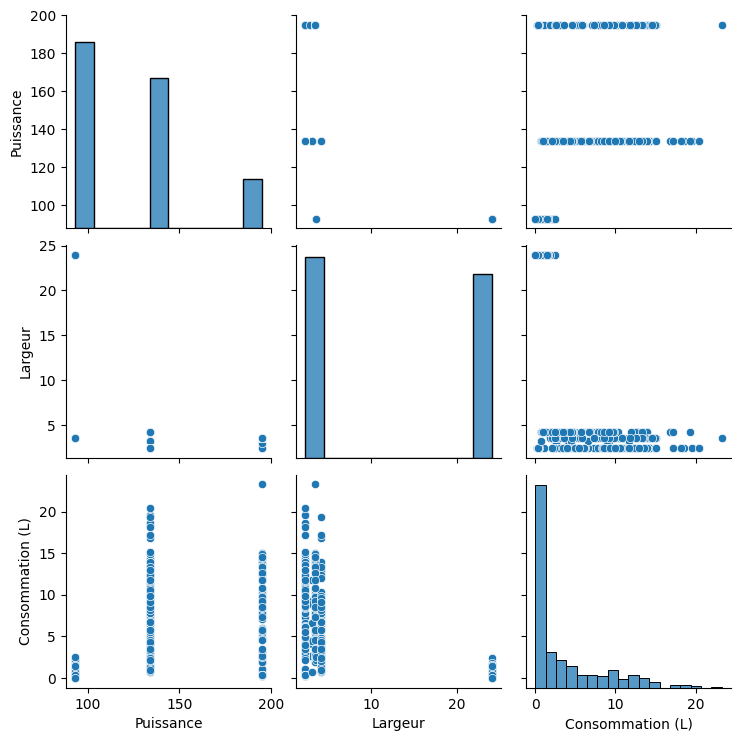

In [8]:
sns.pairplot(interventions );

The pair plot reveals several key insights:  
- The distribution of fuel consumption shows that most values are low, with a few exceeding 3L.  
- **Puissance** and **Largeur** appear to be categorical variables.  


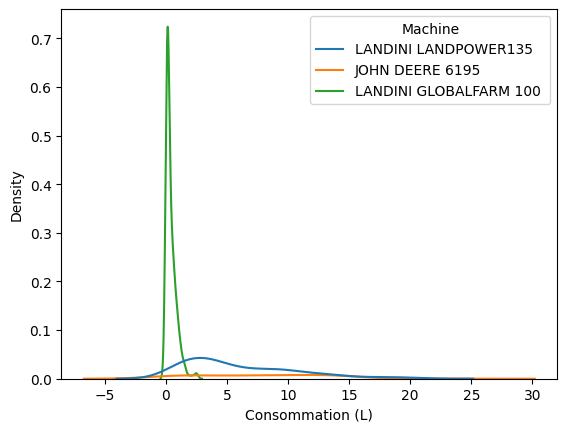

In [9]:
sns.kdeplot(data = interventions , x= 'Consommation (L)' , hue = 'Machine');

The **machine type** seems to be a strong predictor of fuel consumption.  


C:\Users\SetupGame\AppData\Local\Temp\ipykernel_5732\2034229041.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data = interventions , x= 'Consommation (L)' , hue = 'Outil');


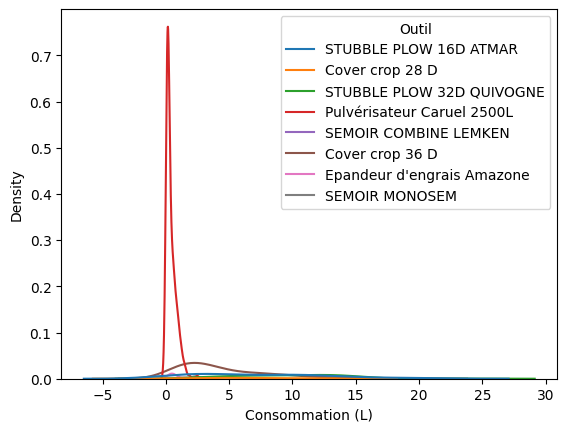

In [10]:
sns.kdeplot(data = interventions , x= 'Consommation (L)' , hue = 'Outil');

The **tool (Outil)** provides similar information as the machine type, suggesting that each machine is associated with a specific set of tools.  


<Axes: xlabel='Outil', ylabel='count'>

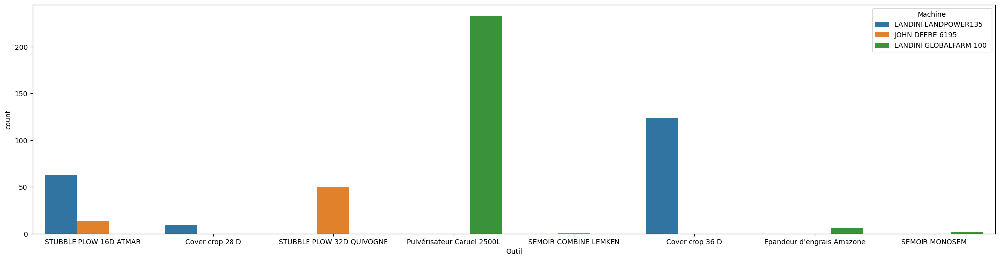

In [11]:
plt.figure(figsize=(25,6))
sns.countplot(data= interventions , x = 'Outil' , hue = 'Machine')

As expected, 


We can also see that some tools and machines are used more frequently than others.  

<Axes: xlabel='Outil', ylabel='count'>

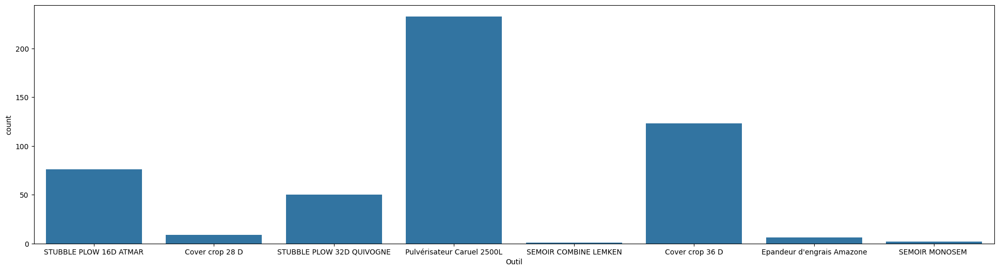

In [12]:
plt.figure(figsize=(24,6))
sns.countplot(data= interventions , x = 'Outil')

Now, we analyze the effect of **trajectory length** on fuel consumption.  


In [13]:
# # Compute lengths for each trajectory
lengths = pd.Series(dtype=float)
for id  , _ in interventions.iterrows(): 
    trajectory_path = trajectories_path / f"{id}.csv"
    if trajectory_path.exists():
        lengths[id] = compute_trajectory_length(trajectory_path)
    else:
        print('A trajectory file does not existe !!!!!!!!')  
        break             


Since this process is computationally expensive, I will save the results for future use.  


In [14]:
lengths.to_csv('lengths.csv' , index= True )

In [15]:
lengths = pd.read_csv('lengths.csv', index_col=0)
lengths = lengths.squeeze()

In [16]:
interventions['Trajectory_Length']  = lengths

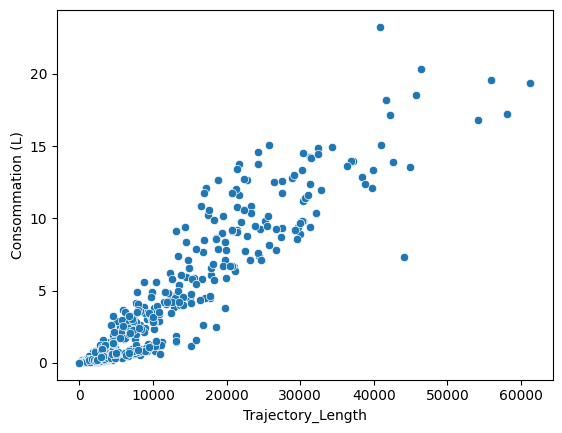

In [17]:
sns.scatterplot(data=interventions , x = 'Trajectory_Length' , y = 'Consommation (L)');

As anticipated, **trajectory length** is a significant predictor of fuel consumption. Next, we examine the impact of incorporating machine type.  

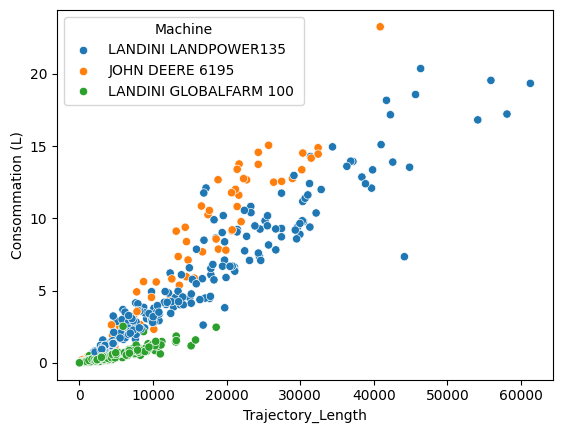

In [18]:
sns.scatterplot(data=interventions , x = 'Trajectory_Length' , y = 'Consommation (L)'  , hue = 'Machine');

We observe a clear separation between different machines. For the **Landini GlobalFarm 100**, a linear regression model is highly effective, but unfortunately, this is not the case for all machines.  


### Exploring the Effect of Duration  


In [19]:
interventions['Debut'] = pd.to_datetime(interventions['Debut'])
interventions['Fin'] = pd.to_datetime(interventions['Fin'])
interventions['Duration'] = interventions['Fin'] - interventions['Debut']
interventions["Duration"] = interventions['Duration'].dt.total_seconds()

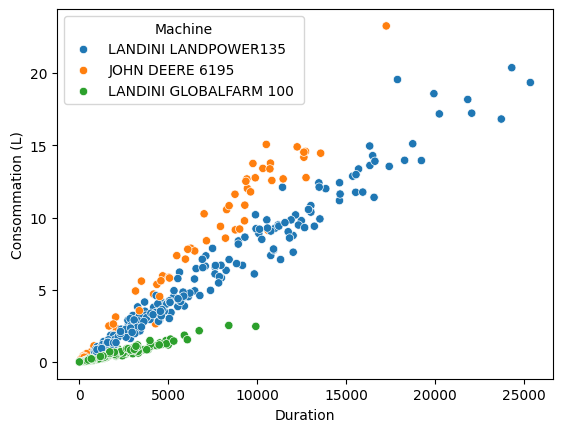

In [20]:
sns.scatterplot(data=interventions , x = 'Duration' , y = 'Consommation (L)'  , hue = 'Machine');

The scatter plots show denser clustering around the regression line. However, as consumption increases, the prediction error also grows.  
This presents a challenge: while the model may achieve a good **Mean Absolute Error (MAE)** during training, the variability in trajectory lengths could lead to unstable predictions.  



#### 3D Visualization  


To summarize our findings so far, we use a **3D plot**, which provides a clear visualization of the discussed trends.

In [21]:
import plotly.express as px

# Create 3D scatter plot
fig = px.scatter_3d(
    interventions, 
    x='Duration', 
    y='Trajectory_Length', 
    z='Consommation (L)', 
    color='Machine',  # Different colors for each machine
    opacity=0.8
)

# Set labels and title
fig.update_layout(
    title="3D Scatter Plot of Duration, Trajectory Length, and Consumption",
    scene=dict(
        xaxis_title="Duration",
        yaxis_title="Trajectory Length",
        zaxis_title="Consommation (L)"
    )
)

# Show the plot
fig.show()


## Baseline Model:


I always start with the simplest model to track progress systematically.  
Let’s begin with a **multiple linear regression model**.  

In [22]:
['Debut', 'Fin', 'Machine', 'Puissance', 'Outil', 'Largeur', 'Parcelle',
       'Operation', 'Consommation (L)']

['Debut',
 'Fin',
 'Machine',
 'Puissance',
 'Outil',
 'Largeur',
 'Parcelle',
 'Operation',
 'Consommation (L)']

In [23]:
y = interventions['Consommation (L)']
X = MS(['Trajectory_Length' , 'Duration']).fit_transform(interventions)

In [24]:
X

,intercept,Trajectory_Length,Duration
ID,,,
284530,1.0,44158.868024,7122.0
284454,1.0,39695.623206,11430.0
283718,1.0,55914.310650,17886.0
283288,1.0,16810.207481,2778.0
282399,1.0,19743.015348,3294.0
...,...,...,...
29088,1.0,10366.538479,3984.0
28975,1.0,2883.609727,1344.0
28842,1.0,2408.559212,690.0


In [25]:
X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state  = 42)
MLRegression = sm.OLS(y_train,X_train)
results = MLRegression.fit()

y_pred = results.predict(X_test)



mean_absolute_error(y_test , y_pred)

1.044452178918227

**Results:** Not bad!  


### Improving the Model: Random Forest  


In [26]:
interventions['Hour'] = interventions['Debut'].dt.hour
interventions['Month'] = interventions['Debut'].dt.month
interventions['Duration'] = (interventions['Fin'] - interventions['Debut']).dt.total_seconds() / 3600


In [27]:


categorical_cols = ['Machine', 'Puissance', 'Outil', 'Largeur', 'Parcelle', 'Operation']
encoders = {}
for col in categorical_cols:
        encoders[col] = LabelEncoder()
        interventions[col + '_encoded'] = encoders[col].fit_transform(interventions[col])
        
        
features = ['Hour', 'Month', 'Duration'] + \
           [col + '_encoded' for col in categorical_cols] + \
           ['Trajectory_Length']


X = interventions[features]
y = interventions['Consommation (L)']


In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42  )
    
# Train model
rf = RandomForestRegressor(n_estimators=1000, random_state=42 , max_depth= 10)
rf.fit(X_train, y_train)


RandomForestRegressor(max_depth=10, n_estimators=1000, random_state=42)

In [29]:

# Evaluate
y_pred = rf.predict(X_test)
mae = mean_absolute_error(y_test , y_pred)
mae

0.4896275753298657

**Results:** *Much better!*  


## In-Depth Analysis: Trajectory-Level Exploration  


The critical question:  
**Why do some trajectories exhibit different fuel consumption despite having the same machine, duration, and trajectory length?**  
It seems unlikely that we can answer this question using only metadata. Instead, we need to analyze the trajectories themselves.  


To facilitate exploration, I created an **interactive map** that allows us to select trajectories and parcels.  
This was particularly useful for generating new features, such as **inside parcel travel distance**.  

In [30]:

all_files = parcels_folder.glob('*.csv')

df_list = []
for file in all_files:
    file_name = file.stem
    temp_df = pd.read_csv(file)
    temp_df["parcel_name"] = file_name
    df_list.append(temp_df)

combined_df = pd.concat(df_list, ignore_index=True).drop_duplicates(subset=['Latitude', 'Longitude'])

In [31]:


# Load parcel data
all_files = parcels_folder.glob('*.csv')

df_list = []
for file in all_files:
    file_name = file.stem
    temp_df = pd.read_csv(file)
    temp_df["parcel_name"] = file_name
    df_list.append(temp_df)

combined_df = pd.concat(df_list, ignore_index=True).drop_duplicates(subset=['Latitude', 'Longitude'])

# Generate unique colors for each parcel
parcel_names = combined_df["parcel_name"].unique()
colors = {parcel: to_hex(tab20(i / len(parcel_names))) for i, parcel in enumerate(parcel_names)}

# Initialize the map
m = folium.Map(
    location=[combined_df["Latitude"].mean(), combined_df["Longitude"].mean()],
    zoom_start=13
)

# Create a FeatureGroup for each parcel
for parcel in parcel_names:
    parcel_group = folium.FeatureGroup(name=f"Parcel {parcel}")
    parcel_data = combined_df[combined_df["parcel_name"] == parcel]
    
    # Extract coordinates for the polygon
    coordinates = parcel_data[['Latitude', 'Longitude']].values.tolist()
    
    # Add polygon to the map
    folium.Polygon(
        locations=coordinates,
        color=colors[parcel],
        fill=True,
        fill_color=colors[parcel],
        fill_opacity=0.7,
        popup=f"Parcel: {parcel}"
    ).add_to(parcel_group)
    
    # Add parcel group to the map
    parcel_group.add_to(m)



# Define folder path for trajectories
folder_path = Path(trajectories_path)

# List all CSV files in the folder
csv_files = [f.name for f in folder_path.iterdir() if f.suffix == '.csv']

# Generate unique colors for trajectories
colors = [to_hex(tab20(i / len(csv_files))) for i in range(len(csv_files))]

# Plot each trajectory with a unique color and visible labels
for file, color in zip(csv_files, colors):
    file_path = folder_path / file
    plot_trajectory(file_path, f"Trajectory {file.split('.')[0]}", 'red')

# Add Layer Control
folium.LayerControl().add_to(m)

# Save or display the map
m.save("parcels_map.html")
m



**Key Observations:**  
- Some trajectories have significantly more distance traveled **inside the parcel** than others.  
- **Turn rate** appears to be an important factor, as vehicles consume more fuel per unit distance when the trajectory is not straight.



*Note:* If you cannot open this interactive map in the notebook, you can view the attached HTML file, which contains the same information.  


## Modeling Strategy  


In an ideal scenario, trajectories should be clustered into three groups based on metadata:  
1. **Low fuel consumption**  
2. **Medium fuel consumption**  
3. **High fuel consumption**  

Then, we would train a **separate model for each cluster**. However, due to time constraints, I used a single model, which still yielded satisfactory results.

In [32]:


df = interventions.copy()

# Create new feature for duration
df['Duration'] = (pd.to_datetime(df['Fin']) - pd.to_datetime(df['Debut'])).dt.total_seconds()

# Preprocessing
numerical_features = ['Puissance', 'Largeur',  'Duration']
categorical_features = ['Machine', 'Outil', 'Parcelle', 'Operation']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

X = preprocessor.fit_transform(df)

In [33]:


# Choose the number of clusters (e.g., 3)
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(X)

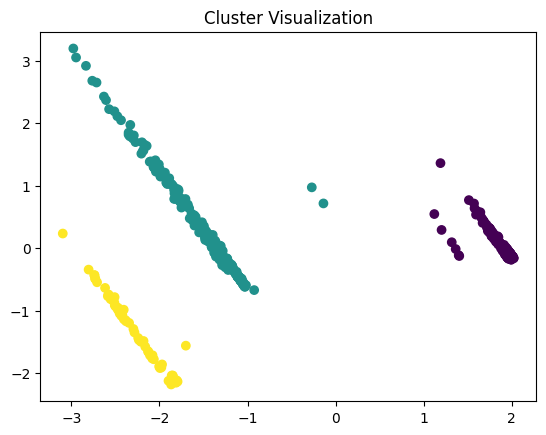

In [34]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df['Cluster'], cmap='viridis')
plt.title('Cluster Visualization')
plt.show()


In [35]:


# Label Encoding for categorical variables
encoders = {}
for col in categorical_cols:
    encoders[col] = LabelEncoder()
    df[col + '_encoded'] = encoders[col].fit_transform(df[col])

# Prepare feature set
features = numerical_features + [col + '_encoded' for col in categorical_cols]
X = df[features]
y = df['Consommation (L)']

# Normalize numerical features and One-Hot Encode categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), [col + '_encoded' for col in categorical_cols])
    ]
)

X_transformed = preprocessor.fit_transform(df)

# Apply K-Means clustering
n_clusters = 3  # Adjust as needed
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df['Cluster'] = kmeans.fit_predict(X_transformed)

# Train RandomForestRegressor separately for each cluster
mae_per_cluster = {}

for cluster in range(n_clusters):
    print(f"Training model for Cluster {cluster}")

    # Filter data for the current cluster
    cluster_data = df[df['Cluster'] == cluster]

    if len(cluster_data) < 10:  # Ensure enough samples for training
        print(f"Skipping Cluster {cluster} due to insufficient data.")
        continue

    # Define cluster-specific features and target
    X_cluster = cluster_data[features]
    y_cluster = cluster_data['Consommation (L)']

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_cluster, y_cluster, test_size=0.2, random_state=42)

    # Train RandomForestRegressor
    rf = RandomForestRegressor(n_estimators=1000, random_state=42, max_depth=10)
    rf.fit(X_train, y_train)

    # Predict and calculate MAE
    y_pred = rf.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)

    # Store MAE for this cluster
    mae_per_cluster[cluster] = mae
    print(f"Cluster {cluster} MAE: {mae:.4f}")

# Display final MAE results
print("\nMAE per cluster:", mae_per_cluster)


Training model for Cluster 0
Cluster 0 MAE: 0.0668
Training model for Cluster 1
Cluster 1 MAE: 0.6409
Training model for Cluster 2
Cluster 2 MAE: 0.5521

MAE per cluster: {0: 0.06676870188250796, 1: 0.6408964959010607, 2: 0.5521270608974432}


As previously mentioned, some clusters are easier to predict than others. However, due to time constraints, we will temporarily disregard this information and focus on a generalized approach. This aspect can be explored and refined in future iterations.

---


After extensive experimentation—including clustering and neural networks—the most effective approach is:  
1. Predicting the **fuel consumption difference between consecutive timestamps** in a trajectory using **Random Forest or XGBoost**.  
2. Summing these predicted differences to estimate the **total fuel consumption**.  

---

### Data Transformation: The Most Challenging Step  


Handling data transformations was the most complex aspect of this project—more difficult than model selection and tuning.  

I did not implement a full pipeline, so my approach is suboptimal.  
Instead, I manually replicated the **training data transformations** for the test data.  

To prepare the dataset:  
- We **combine all trajectory data** into a single CSV file.  
- We merge it with metadata from the `interventions.csv` file.  

  



In [36]:
interventions['Debut'] = pd.to_datetime(interventions['Debut'])
interventions['Fin'] = pd.to_datetime(interventions['Fin'])
interventions['Duration'] = interventions['Fin'] - interventions['Debut']
interventions["Duration"] = interventions['Duration'].dt.total_seconds()




interventions_test['Debut'] = pd.to_datetime(interventions_test['Debut'])
interventions_test['Fin'] = pd.to_datetime(interventions_test['Fin'])
interventions_test['Duration'] = interventions_test['Fin'] - interventions_test['Debut']
interventions_test["Duration"] = interventions_test['Duration'].dt.total_seconds()

In [37]:
columns_to_copy = ['Machine', 'Outil', 'Parcelle','Operation' , 'Puissance' , 'Largeur' , 'Duration']


dir_path = (competition_folder  / 'trajets_train'  /  'trajets_train')

parcelles_path = competition_folder / 'Parcelles'

# List all CSV files in the directory using pathlib
csv_files = list(dir_path.glob('*.csv'))



# Initialize an empty list to store dataframes
dfs = []

# Load all CSV files into separate dataframes and append them to the list
for file in csv_files:
    df = pd.read_csv(file)
    id = int(file.stem)

    df['id'] = id



    df['Temps'] = pd.to_datetime(df['Temps'])
    df['Time_Interval'] = df['Temps'].diff().dt.total_seconds()
    df.loc[0 , 'Time_Interval'] = 0
    df['Time_cum'] = df['Time_Interval'].cumsum()



    df['Month'] = df['Temps'].dt.month
    df['Day'] = df['Temps'].dt.day
    df['Hour'] = df['Temps'].dt.hour
    df['Minute'] = df['Temps'].dt.minute
    df['Second'] = df['Temps'].dt.second





    df.drop(columns='Temps' , inplace=True)



    df['Consommation_diff'] = df['Consommation (ml)'].diff()
    df.loc[0 , 'Consommation_diff'] =  df['Consommation (ml)'][0]


    interventions['Debut'] = pd.to_datetime(interventions['Debut'])
    interventions['Fin'] = pd.to_datetime(interventions['Fin'])
    interventions['Duration'] = interventions['Fin'] - interventions['Debut']
    interventions["Duration"] = interventions['Duration'].dt.total_seconds()



    for col in columns_to_copy:
        df[col] = interventions.loc[id, col]




    parcelle_polygon = load_parcelle(df['Parcelle'].iloc[0], parcelles_path)

      # Load corresponding parcelle and check if points are inside/outside

    if parcelle_polygon is not None:
        # Create points from longitude and latitude
        df['inside_parcelle'] = [
            1 if parcelle_polygon.contains(Point(lon, lat)) else 0
            for lon, lat in zip(df['Longitude'], df['Latitude'])
        ]
    else:
        df['inside_parcelle'] = 0

    # Calculate the distance difference between consecutive points
    df['distance_diff'] = [
        geodesic((lat1, lon1), (lat2, lon2)).meters
        if idx > 0 else 0
        for idx, (lat1, lon1, lat2, lon2) in enumerate(zip(
            df['Latitude'], df['Longitude'],
            df['Latitude'].shift(), df['Longitude'].shift()
        ))
    ]



    df['acceleration'] = df['Vitesse'].diff() / df['Time_Interval']
    df.loc[df['Time_Interval'] == 0, 'acceleration'] = 0  # Handle division by zero


    df['delta_longitude'] = df['Longitude'].diff()
    df['delta_latitude'] = df['Latitude'].diff()

   # Calculate change in bearing between consecutive points
    df['curvature'] = np.abs(
       np.arctan2(df['delta_latitude'], df['delta_longitude']).diff()
    )
    df['curvature'] = df['curvature'].fillna(0)  # Handle NaN values


    segment_size = 20  # Adjust the segment size based on your data
    df['segment'] = (df.index // segment_size).astype(int)

    segment_features = df.groupby('segment').agg({
        'distance_diff': ['mean', 'sum'],
        'Vitesse': ['mean', 'max'],
        'acceleration': ['mean', 'max'],

        'Consommation_diff': 'sum'
    })

    segment_features.columns = ['_'.join(col) for col in segment_features.columns]
    df = df.merge(segment_features, left_on='segment', right_index=True)


                                                               # Add a column for the trajectory ID using the file name (without extension)
    dfs.append(df)

# Concatenate all dataframes into one
combined_df = pd.concat(dfs, ignore_index=True)

The same preprocessing steps are applied to the **test set**.  

In [38]:
columns_to_copy = ['Machine', 'Outil', 'Parcelle','Operation' , 'Puissance' , 'Largeur' , 'Duration']


dir_path = (competition_folder  / 'trajets_test')

parcelles_path = competition_folder / 'Parcelles'

# List all CSV files in the directory using pathlib
csv_files = list(dir_path.glob('*.csv'))









# Initialize an empty list to store dataframes
dfs = []

# Load all CSV files into separate dataframes and append them to the list
for file in csv_files:
    df = pd.read_csv(file)
    id = int(file.stem)

    df['id'] = id



    df['Temps'] = pd.to_datetime(df['Temps'])
    df['Time_Interval'] = df['Temps'].diff().dt.total_seconds()
    df.loc[0 , 'Time_Interval'] = 0
    df['Time_cum'] = df['Time_Interval'].cumsum()



    df['Month'] = df['Temps'].dt.month
    df['Day'] = df['Temps'].dt.day
    df['Hour'] = df['Temps'].dt.hour
    df['Minute'] = df['Temps'].dt.minute
    df['Second'] = df['Temps'].dt.second





    df.drop(columns='Temps' , inplace=True)










    for col in columns_to_copy:
        df[col] = interventions_test.loc[id, col]




    parcelle_polygon = load_parcelle(df['Parcelle'].iloc[0], parcelles_path)

      # Load corresponding parcelle and check if points are inside/outside

    if parcelle_polygon is not None:
        # Create points from longitude and latitude
        df['inside_parcelle'] = [
            1 if parcelle_polygon.contains(Point(lon, lat)) else 0
            for lon, lat in zip(df['Longitude'], df['Latitude'])
        ]
    else:
        df['inside_parcelle'] = 0

    # Calculate the distance difference between consecutive points
    df['distance_diff'] = [
        geodesic((lat1, lon1), (lat2, lon2)).meters
        if idx > 0 else 0
        for idx, (lat1, lon1, lat2, lon2) in enumerate(zip(
            df['Latitude'], df['Longitude'],
            df['Latitude'].shift(), df['Longitude'].shift()
        ))
    ]



    df['acceleration'] = df['Vitesse'].diff() / df['Time_Interval']
    df.loc[df['Time_Interval'] == 0, 'acceleration'] = 0  # Handle division by zero


    df['delta_longitude'] = df['Longitude'].diff()
    df['delta_latitude'] = df['Latitude'].diff()

   # Calculate change in bearing between consecutive points
    df['curvature'] = np.abs(
       np.arctan2(df['delta_latitude'], df['delta_longitude']).diff()
    )
    df['curvature'] = df['curvature'].fillna(0)  # Handle NaN values


    segment_size = 20  # Adjust the segment size based on your data
    df['segment'] = (df.index // segment_size).astype(int)

    segment_features = df.groupby('segment').agg({
        'distance_diff': ['mean', 'sum'],
        'Vitesse': ['mean', 'max'],
        'acceleration': ['mean', 'max'],


    })

    segment_features.columns = ['_'.join(col) for col in segment_features.columns]
    df = df.merge(segment_features, left_on='segment', right_index=True)












                                                               # Add a column for the trajectory ID using the file name (without extension)
    dfs.append(df)

# Concatenate all dataframes into one
combined_df_test = pd.concat(dfs, ignore_index=True)




#### Feature Engineering  

I will generate all possible features first and then refine the selection based on performance.  




In [39]:
# Season Feature
combined_df_test['Season'] = combined_df_test['Month'].map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

# Weekend Indicator
combined_df_test['is_weekend'] = combined_df_test['Day'].apply(lambda x: 1 if x in [6, 7] else 0)

# Circularity
combined_df_test['circularity'] = combined_df_test['distance_diff_sum'] / combined_df_test['distance_diff_mean']

# Interaction Feature Example
combined_df_test['tool_machine_interaction'] = combined_df_test['Machine'] + "_" + combined_df_test['Outil']

In [40]:
combined_df['Season'] = combined_df['Month'].map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

# Weekend Indicator
combined_df['is_weekend'] = combined_df['Day'].apply(lambda x: 1 if x in [6, 7] else 0)

# Circularity
combined_df['circularity'] = combined_df['distance_diff_sum'] / combined_df['distance_diff_mean']

# Interaction Feature Example
combined_df['tool_machine_interaction'] = combined_df['Machine'] + "_" + combined_df['Outil']

One crucial feature is distinguishing between:  
- **Fuel consumption inside the parcel**  
- **Fuel consumption during transportation (to/from the parcel)**  

This significantly improves model performance.  

In [41]:
# Calculate inside_parcelle_mean for each trajectory
inside_parcelle_mean_by_trajectory = combined_df.groupby('id')['inside_parcelle'].mean().reset_index()
inside_parcelle_mean_by_trajectory.rename(columns={'inside_parcelle': 'inside_parcelle_mean'}, inplace=True)

# Merge the feature back into the main dataset
combined_df = pd.merge(combined_df, inside_parcelle_mean_by_trajectory, on='id', how='left')

In [42]:
# Group by trajectory ID and compute mean and standard deviation of curvature
curvature_stats_by_trajectory = combined_df.groupby('id')['curvature'].agg(['mean', 'std']).reset_index()
curvature_stats_by_trajectory.rename(columns={'mean': 'curvature_mean', 'std': 'curvature_std'}, inplace=True)

# Merge these statistics back into the main dataset
combined_df = pd.merge(combined_df, curvature_stats_by_trajectory, on='id', how='left')



# Group by trajectory ID and compute mean and standard deviation of curvature
curvature_stats_by_trajectory = combined_df_test.groupby('id')['curvature'].agg(['mean', 'std']).reset_index()
curvature_stats_by_trajectory.rename(columns={'mean': 'curvature_mean', 'std': 'curvature_std'}, inplace=True)

# Merge these statistics back into the main dataset
combined_df_test = pd.merge(combined_df_test, curvature_stats_by_trajectory, on='id', how='left')







# Time of day features
combined_df['time_of_day'] = pd.cut(combined_df['Hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['night', 'morning', 'afternoon', 'evening'])

# Part of day (binary features for peak working hours)
combined_df['is_peak_hours'] = ((combined_df['Hour'] >= 8) &
                               (combined_df['Hour'] <= 17)).astype(int)




# Time of day features
combined_df_test['time_of_day'] = pd.cut(combined_df_test['Hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['night', 'morning', 'afternoon', 'evening'])

# Part of day (binary features for peak working hours)
combined_df_test['is_peak_hours'] = ((combined_df_test['Hour'] >= 8) &
                               (combined_df_test['Hour'] <= 17)).astype(int)





# Speed changes and patterns
combined_df['speed_variance'] = combined_df.groupby('id')['Vitesse'].transform('var')
combined_df['speed_change_rate'] = combined_df['Vitesse'].diff() / combined_df['Time_Interval']
combined_df['acceleration_squared'] = combined_df['acceleration'] ** 2  # For high acceleration impacts

# Movement patterns
combined_df['stop_time'] = (combined_df['Vitesse'] < 0.1).astype(int)
combined_df['stop_time_ratio'] = combined_df.groupby('id')['stop_time'].transform('mean')






# Speed changes and patterns
combined_df_test['speed_variance'] = combined_df_test.groupby('id')['Vitesse'].transform('var')
combined_df_test['speed_change_rate'] = combined_df_test['Vitesse'].diff() / combined_df_test['Time_Interval']
combined_df_test['acceleration_squared'] = combined_df_test['acceleration'] ** 2  # For high acceleration impacts

# Movement patterns
combined_df_test['stop_time'] = (combined_df_test['Vitesse'] < 0.1).astype(int)
combined_df_test['stop_time_ratio'] = combined_df_test.groupby('id')['stop_time'].transform('mean')






# Calculate trajectory complexity
combined_df['direction_changes'] = abs(combined_df['curvature']).rolling(window=10).sum()
combined_df['trajectory_straightness'] = combined_df.groupby('id').apply(
    lambda x: x['distance_diff'].sum() /
    ((x['Longitude'].max() - x['Longitude'].min())**2 +
     (x['Latitude'].max() - x['Latitude'].min())**2)**0.5
).reset_index(level=0)['id']

# Field border proximity
combined_df['border_operation'] = (combined_df['inside_parcelle'].diff() != 0).astype(int)





# Calculate trajectory complexity
combined_df_test['direction_changes'] = abs(combined_df_test['curvature']).rolling(window=10).sum()
combined_df_test['trajectory_straightness'] = combined_df_test.groupby('id').apply(
    lambda x: x['distance_diff'].sum() /
    ((x['Longitude'].max() - x['Longitude'].min())**2 +
     (x['Latitude'].max() - x['Latitude'].min())**2)**0.5
).reset_index(level=0)['id']

# Field border proximity
combined_df_test['border_operation'] = (combined_df_test['inside_parcelle'].diff() != 0).astype(int)





# Power-related features
combined_df['power_to_width_ratio'] = combined_df['Puissance'] / combined_df['Largeur']

# Create efficiency metrics
combined_df['speed_power_interaction'] = combined_df['Vitesse'] * combined_df['Puissance']
combined_df['tool_width_speed'] = combined_df['Largeur'] * combined_df['Vitesse']




# Power-related features
combined_df_test['power_to_width_ratio'] = combined_df_test['Puissance'] / combined_df_test['Largeur']

# Create efficiency metrics
combined_df_test['speed_power_interaction'] = combined_df_test['Vitesse'] * combined_df_test['Puissance']
combined_df_test['tool_width_speed'] = combined_df_test['Largeur'] * combined_df_test['Vitesse']



# Operation duration metrics
operation_avg_duration = combined_df.groupby('Operation')['Duration'].transform('mean')
combined_df['duration_vs_avg'] = combined_df['Duration'] / operation_avg_duration

# Operation complexity
combined_df['operation_speed_norm'] = combined_df.groupby('Operation')['Vitesse'].transform(
    lambda x: (x - x.mean()) / x.std())




# Operation duration metrics
operation_avg_duration = combined_df_test.groupby('Operation')['Duration'].transform('mean')
combined_df_test['duration_vs_avg'] = combined_df_test['Duration'] / operation_avg_duration

# Operation complexity
combined_df_test['operation_speed_norm'] = combined_df_test.groupby('Operation')['Vitesse'].transform(
    lambda x: (x - x.mean()) / x.std())





# Operation duration metrics
operation_avg_duration = combined_df_test.groupby('Operation')['Duration'].transform('mean')
combined_df_test['duration_vs_avg'] = combined_df_test['Duration'] / operation_avg_duration

# Operation complexity
combined_df_test['operation_speed_norm'] = combined_df_test.groupby('Operation')['Vitesse'].transform(
    lambda x: (x - x.mean()) / x.std())






# Time-based workload
combined_df['cumulative_work_day'] = combined_df.groupby(['Day', 'Month'])['Time_cum'].transform('cumsum')

# Field utilization
combined_df['field_coverage'] = combined_df.groupby('Parcelle')['inside_parcelle'].transform('cumsum')




# Time-based workload
combined_df_test['cumulative_work_day'] = combined_df_test.groupby(['Day', 'Month'])['Time_cum'].transform('cumsum')

# Field utilization
combined_df_test['field_coverage'] = combined_df_test.groupby('Parcelle')['inside_parcelle'].transform('cumsum')



# Rolling statistics for key metrics
window_size = 20
for col in ['Vitesse', 'acceleration', 'Consommation_diff']:
    combined_df[f'{col}_rolling_mean'] = combined_df.groupby('id')[col].transform(
        lambda x: x.rolling(window=window_size, min_periods=1).mean())
    combined_df[f'{col}_rolling_std'] = combined_df.groupby('id')[col].transform(
        lambda x: x.rolling(window=window_size, min_periods=1).std())









C:\Users\SetupGame\AppData\Local\Temp\ipykernel_5732\525193081.py:79: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\SetupGame\AppData\Local\Temp\ipykernel_5732\525193081.py:78: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\SetupGame\AppData\Local\Temp\ipykernel_5732\525193081.py:94: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\SetupGame\AppData\Local\Temp\ipykernel_5732\525193081.py:93: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the grouping

In [43]:


# Define the columns to use as features and target
features = ['Time_cum', 'Machine', 'Outil', 'Parcelle', 'inside_parcelle',
            'distance_diff', 'distance_diff_sum', 'Vitesse_mean',
            'Vitesse_max' ,  'acceleration_max', 'acceleration', 'Season' , 'is_weekend' ,'stop_time'  ]


target = 'Consommation_diff'

# Include 'id' in the feature set temporarily for grouping
X = combined_df[features + ['id']]  # Add 'id' to the features
y = combined_df[target]

# Convert categorical variables to dummy/indicator variables (one-hot encoding)
X = pd.get_dummies(X, columns=['Machine', 'Outil', 'Parcelle' , 'Season'  ], drop_first=True)



Another effective strategy was **adding lag features** (values from previous timestamps).  
This makes sense intuitively, as fuel consumption at a given timestamp depends on previous data points.  

---

In [44]:

# Define the features to lag
lag_features = ['distance_diff', 'distance_diff_sum', 'acceleration']

# Number of lag steps to create
num_lags = 6 # You can adjust this

# Create lag features within each 'id' group
for lag in range(1, num_lags + 1):
    for col in lag_features:
        X[f'{col}_lag_{lag}'] = X.groupby('id')[col].shift(lag)

# Drop rows with NaN values caused by lagging
X.dropna(inplace=True)
y = y.loc[X.index]  # Ensure target aligns with lagged features

# Save the feature names from the training data
training_feature_names = X.columns


#### Preventing Data Leakage  
---
To ensure a reliable **MAE evaluation**, we must avoid including the same trajectory in both the training and test sets.  
This safeguards against data leakage and provides a realistic error estimate based on the **sum of the entire trajectory's fuel consumption**.  

---

In [45]:

# Split the data into training and testing sets using GroupShuffleSplit
group_split = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=30)
train_idx, test_idx = next(group_split.split(X, y, groups=X['id']))

# Create the training and test sets
X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

# Remove 'id' from the feature set before training the model
X_train = X_train.drop(columns=['id'])
X_test = X_test.drop(columns=['id'])





## Training the Model  
---
I experimented with several models and found that **XGBoost Regressor** provided:  
- **High precision**  
- **Fast training time**  
---

In [46]:
# Initialize and train the Random Forest Regressor
rf_regressor = xgb.XGBRegressor(
    n_estimators=250,
    random_state=42,
  # Ensure evaluation is based on MAE
)


#rf_regressor = GradientBoostingRegressor(n_estimators=150, random_state=42)
# Train the model

#rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_regressor.predict(X_test)

# Add the predictions and 'id' back to the test dataframe
X_test['Consommation_diff'] = y_test
X_test['Consommation_diff_pred'] = y_pred
X_test['id'] = X.iloc[test_idx]['id'].values  # Add 'id' back to X_test

# Group by 'id' and sum the actual and predicted 'Consommation_diff'
trajectory_sum_actual = X_test.groupby('id')['Consommation_diff'].sum()
trajectory_sum_pred = X_test.groupby('id')['Consommation_diff_pred'].sum()

# Calculate the MAE for trajectory-level predictions
mae_trajectory = mean_absolute_error(trajectory_sum_actual, trajectory_sum_pred)
print(f"Mean Absolute Error (Trajectory-Level Predictions): {mae_trajectory}")

Mean Absolute Error (Trajectory-Level Predictions): 205.3302149963378


### Final Predictions  

We now use the trained model to make predictions on the test set for submission.  

In [47]:
# Prepare the test data (combined_df_test)
X_test_new = combined_df_test[features + ['id']]  # Include 'id' for grouping
X_test_new = pd.get_dummies(X_test_new, columns=['Machine', 'Outil', 'Parcelle' , 'Season'], drop_first=True)



# Define the features to lag
lag_features = ['distance_diff', 'distance_diff_sum', 'acceleration']

#Number of lag steps to create
num_lags = 6  # You can adjust this

# Create lag features within each 'id' group
for lag in range(1, num_lags + 1):
    for col in lag_features:
        X_test_new[f'{col}_lag_{lag}'] = X_test_new.groupby('id')[col].shift(lag)

# Drop rows with NaN values caused by lagging
X_test_new[lag_features] = X_test_new.groupby('id')[lag_features].ffill()



# Align test data columns with training data columns
# Add missing columns to the test data and fill them with zeros
for col in training_feature_names:
    if col not in X_test_new.columns:
        X_test_new[col] = 0

# Ensure the columns are in the same order as the training data
X_test_new = X_test_new[training_feature_names]

# Remove 'id' from the feature set before making predictions
X_test_new_features = X_test_new.drop(columns=['id'])

# Make predictions on the new test set
y_pred_new = rf_regressor.predict(X_test_new_features)

# Add the predictions and 'id' back to the test dataframe
X_test_new['Consommation_diff_pred'] = y_pred_new
X_test_new['id'] = combined_df_test['id'].values  # Add 'id' back to X_test_new

# Group by 'id' and sum the predicted 'Consommation_diff' for each trajectory
trajectory_sum_pred_new = X_test_new.groupby('id')['Consommation_diff_pred'].sum()

# Display the summed predictions for each trajectory
print(trajectory_sum_pred_new)

id
28380      431.955811
28408      388.600800
28442      746.352966
28756      605.184570
29166      455.749451
             ...     
222040     389.126190
222646     329.265869
252113    3824.876953
281373    4179.421875
282158    2896.170654
Name: Consommation_diff_pred, Length: 320, dtype: float32


In [48]:
trajectory_sum_pred_new_l  = trajectory_sum_pred_new * 0.001

In [49]:
final = pd.DataFrame({
    'ID': trajectory_sum_pred_new_l.index,
    'Consommation (L)': trajectory_sum_pred_new_l
} )

In [50]:
final.to_csv((competition_folder / 'predictionshope13.csv') , index = False)


## Conclusion  


---
This was an incredibly interesting project that provided valuable insights into fuel consumption prediction.  
we thoroughly enjoyed working on it and learned a great deal throughout the process.  


---
